# Installation

In [2]:
!pip install -r https://raw.githubusercontent.com/google-ai-edge/ai-edge-torch/main/requirements.txt

Looking in links: https://download.pytorch.org/whl/torch/, https://download.pytorch.org/whl/torchvision/, https://download.pytorch.org/whl/torchaudio/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.0/195.0 MB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 59.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 46.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.2/615.2 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 55.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.2/138.2 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 44.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 62.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.4/120.4 kB 7.0

In [1]:
!pip install -q ai-edge-torch-nightly
!pip install -q ai-edge-model-explorer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.5/274.5 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.7/84.7 MB 8.6 MB/s eta 0:00:00


# Imports

In [2]:
import numpy as np
import ai_edge_torch
import torch
import requests
import model_explorer
import torchvision
from PIL import Image
from torchvision import transforms
from IPython.display import display

/usr/local/lib/python3.10/dist-packages/torch_xla/__init__.py:202: UserWarning: `tensorflow` can conflict with `torch-xla`. Prefer `tensorflow-cpu` when using PyTorch/XLA. To silence this warning, `pip uninstall -y tensorflow && pip install tensorflow-cpu`. If you are in a notebook environment such as Colab or Kaggle, restart your notebook runtime afterwards.
  warnings.warn(


# Resnet18 PyTorch Model

Instantiate `resnet18` as a sample model from PyTorch's `torchvision` package. We also provide it with a sample input and execute it directly via PyTorch.

In [3]:
resnet18 = torchvision.models.resnet18(torchvision.models.ResNet18_Weights.IMAGENET1K_V1).eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 142MB/s]


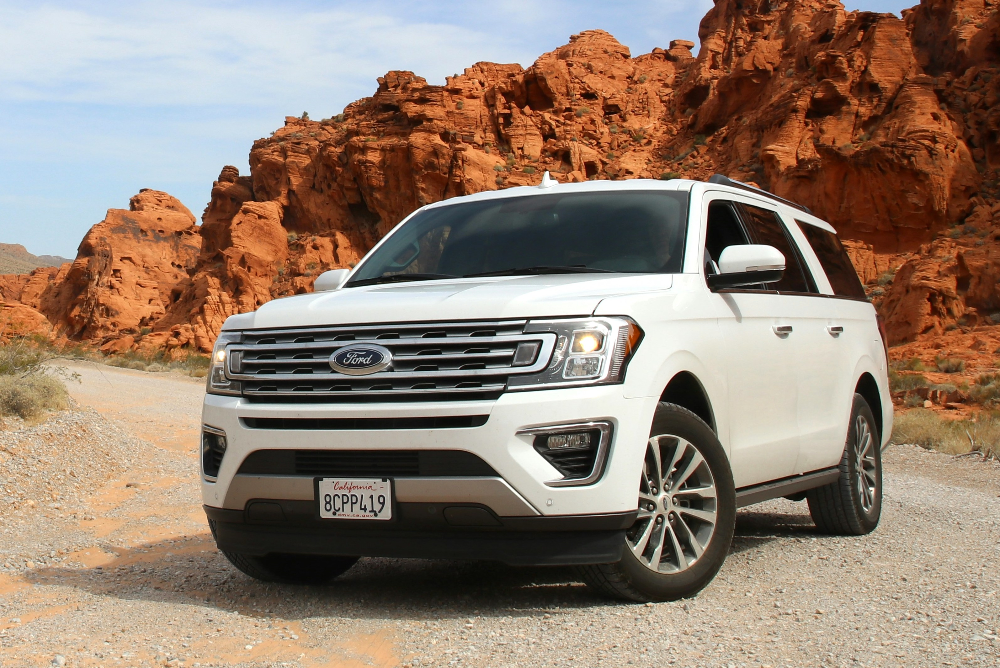

In [4]:
image_path = 'car.jpg'
image = Image.open(image_path)
display(image)

In [5]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize image to 224x224
    transforms.ToTensor(),  # Convert image to PyTorch tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet mean and std
])

# Apply transformations to the image
image_tensor = transform(image)

# Add a batch dimension (1, 3, 224, 224)
image_tensor = image_tensor.unsqueeze(0)

In [6]:
print(image_tensor.shape)

torch.Size([1, 3, 224, 224])


In [7]:
sample_inputs = (image_tensor,)

In [8]:
torch_output = resnet18(*sample_inputs)

In [10]:
len(torch_output[0])

1000

In [11]:
url = "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
response = requests.get(url)

if response.status_code == 200:
    labels = response.json()
    print("ImageNet labels created.")
else:
    print("Failed to download ImageNet labels.")
    labels = []

ImageNet labels created.


In [12]:
probabilities = torch.nn.functional.softmax(torch_output, dim=1)

top_prob, top_catid = torch.topk(probabilities, 1)

if labels:
    predicted_label = labels[top_catid.item()]
    predicted_prob = top_prob.item()
    print(f"Predicted Category: {predicted_label} with Probability: {predicted_prob:.4f}")
else:
    print("Unable to display prediction result due to missing labels.")

Predicted Category: pickup truck with Probability: 0.5507


# Conversion
The `convert` function provided by the `ai_edge_torch` package allows conversion from a PyTorch model to an on-device model. The conversion process also requires a model's sample input for tracing and shape inference.

**Note**: The source PyTorch model needs to be compliant with `torch.export` introduced in PyTorch 2.1.0 .

In [13]:
edge_model = ai_edge_torch.convert(resnet18, sample_inputs)

# Inference
Get outputs from inference with the TFLite runtime by directly calling the edge_model with the inputs. Many of the details of [TFLite inference in Python](https://www.tensorflow.org/lite/guide/inference#load_and_run_a_model_in_python) are abstracted away with this API.

In [14]:
edge_output = edge_model(*sample_inputs)

In [16]:
edge_output[0].shape

(1000,)

In [17]:
top_catid = np.argmax(edge_output)

if labels:
    predicted_label = labels[top_catid]
    print(f"Predicted Category: {predicted_label}")
else:
    print("Unable to display prediction result due to missing labels.")

Predicted Category: pickup truck


# Validation
Here, we make sure that the output generated by the on-device prepared model created by `ai_edge_torch` matches the output generated by PyTorch.

In [18]:
if np.allclose(torch_output.detach().numpy(), edge_output, atol=1e-5):
    print("Inference result with Pytorch and TfLite was within tolerance")
else:
    print("Something wrong with Pytorch --> TfLite")

Inference result with Pytorch and TfLite was within tolerance


# Serialization
The on-device prepared model also provides an `export` interface which can be used to serialize the model. This serializes the model as a TFLite Flatbuffers file.

In [19]:
edge_model.export('resnet.tflite')

# Visualization
The TFLite flatbuffer can be visualized using the AI Edge Model Explorer.

In [20]:
model_explorer.visualize('resnet.tflite')

ℹ️ Please re-run the cell in each new session

Loading extensions...
Loaded 8 extensions:
 - TFLite adapter (Flatbuffer)
 - TFLite adapter (MLIR)
 - TF adapter (MLIR)
 - TF adapter (direct)
 - GraphDef adapter
 - Pytorch adapter (exported program)
 - MLIR adapter
 - JSON adapter


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>